### 1. Imports

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

### 2. Load Dataframe

In [15]:
DFrame = pd.read_csv('spotify_songs.csv')


In [28]:
columns_with_NaN = DFrame.columns[DFrame.isna().any()].tolist()
print(columns_with_NaN)

['track_name', 'track_artist', 'track_album_name']


In [29]:
data_cleaned = DFrame.dropna()
print(data_cleaned.info())
print(data_cleaned.columns)

<class 'pandas.core.frame.DataFrame'>
Index: 32828 entries, 0 to 32832
Data columns (total 23 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   track_id                  32828 non-null  object 
 1   track_name                32828 non-null  object 
 2   track_artist              32828 non-null  object 
 3   track_popularity          32828 non-null  int64  
 4   track_album_id            32828 non-null  object 
 5   track_album_name          32828 non-null  object 
 6   track_album_release_date  32828 non-null  object 
 7   playlist_name             32828 non-null  object 
 8   playlist_id               32828 non-null  object 
 9   playlist_genre            32828 non-null  object 
 10  playlist_subgenre         32828 non-null  object 
 11  danceability              32828 non-null  float64
 12  energy                    32828 non-null  float64
 13  key                       32828 non-null  int64  
 14  loudness   

In [17]:
data_cleaned.nunique()

track_id                    28352
track_name                  23449
track_artist                10692
track_popularity              101
track_album_id              22543
track_album_name            19743
track_album_release_date     4529
playlist_name                 449
playlist_id                   471
playlist_genre                  6
playlist_subgenre              24
danceability                  822
energy                        952
key                            12
loudness                    10222
mode                            2
speechiness                  1270
acousticness                 3731
instrumentalness             4729
liveness                     1624
valence                      1362
tempo                       17682
duration_ms                 19782
dtype: int64

In [52]:
def get_info(df):
    print('INFO \n', df.info(), '\n')
    print('DESC \n', df.describe(), '\n')
    print('DUPLICATES \n', df.duplicated().any(), '\n')
    print('CARDINALITY \n', df.nunique())

print(get_info(data_cleaned))

<class 'pandas.core.frame.DataFrame'>
Index: 32828 entries, 0 to 32832
Data columns (total 23 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   track_id                  32828 non-null  object 
 1   track_name                32828 non-null  object 
 2   track_artist              32828 non-null  object 
 3   track_popularity          32828 non-null  int64  
 4   track_album_id            32828 non-null  object 
 5   track_album_name          32828 non-null  object 
 6   track_album_release_date  32828 non-null  object 
 7   playlist_name             32828 non-null  object 
 8   playlist_id               32828 non-null  object 
 9   playlist_genre            32828 non-null  object 
 10  playlist_subgenre         32828 non-null  object 
 11  danceability              32828 non-null  float64
 12  energy                    32828 non-null  float64
 13  key                       32828 non-null  int64  
 14  loudness   

### 3. Visualizations

# SPLOM

In [27]:
CF_DF = data_cleaned.select_dtypes(exclude='object')
CF_DF.columns

Index(['track_popularity', 'danceability', 'energy', 'key', 'loudness', 'mode',
       'speechiness', 'acousticness', 'instrumentalness', 'liveness',
       'valence', 'tempo', 'duration_ms'],
      dtype='object')

C:\Users\tonit\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\tonit\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\tonit\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\tonit\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating

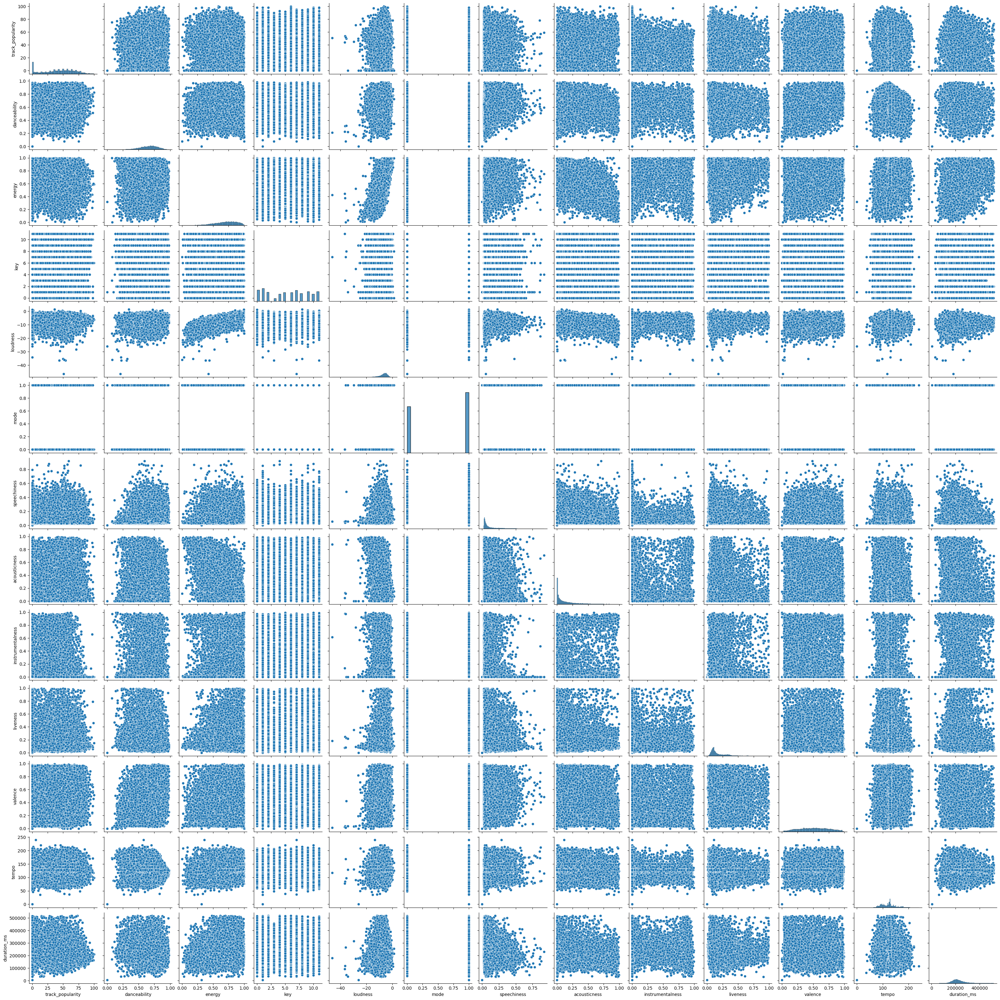

In [19]:
import pandas as pd

def get_splom(df):
    sns.pairplot(df)

get_splom(CF_DF)

# Heatmap

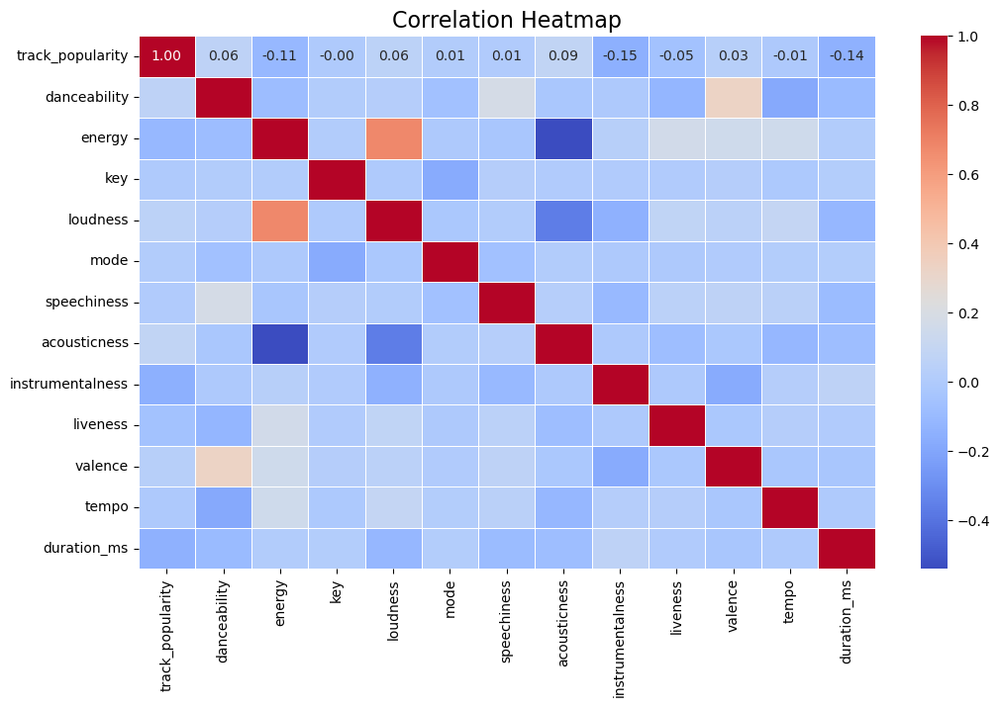

In [58]:
plt.figure(figsize=(12, 7))
heatmap = sns.heatmap(CF_DF.corr(), annot=True, fmt=".2f", cmap="coolwarm", linewidths=.5)
heatmap.set_title("Correlation Heatmap", fontsize=16)

plt.savefig('spotify_songs_heatmap', dpi=300) 

plt.show()

# Barplot

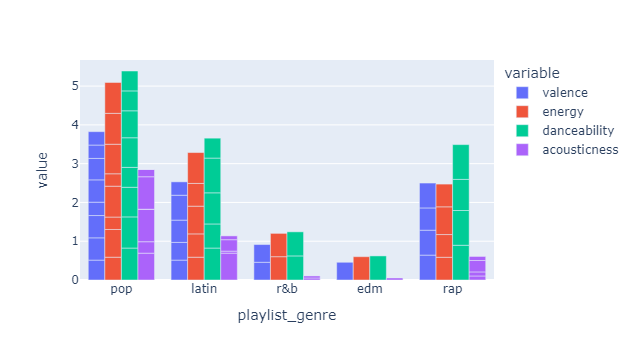

In [30]:
import plotly.express as px

top10_genres = data_cleaned.nlargest(20, 'track_popularity')

fig = px.bar(top10_genres, x='playlist_genre', y=['valence', 'energy', 'danceability', 'acousticness'], barmode='group')
fig.show()



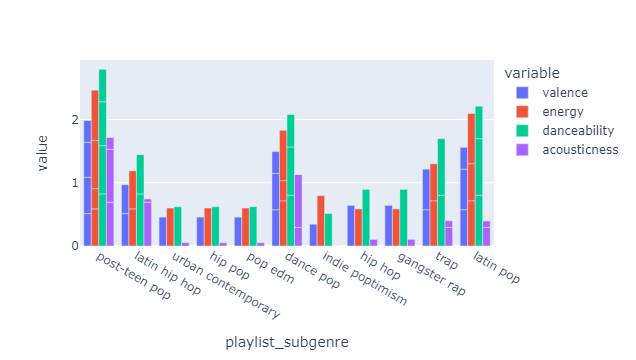

In [35]:
top10_subgenres = data_cleaned.nlargest(20, 'track_popularity')

fig = px.bar(top10_subgenres, x='playlist_subgenre', y=['valence', 'energy', 'danceability', 'acousticness'], barmode='group')
fig.show()


# Pie Chart

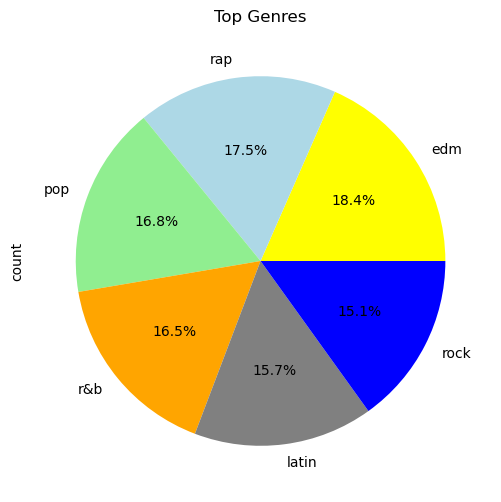

In [56]:
top_genres = data_cleaned['playlist_genre'].value_counts().nlargest(10)

# Define custom colors for the slices
custom_colors = ['yellow', 'lightblue', 'lightgreen', 'orange', 'grey', 'blue', 'red', 'purple', 'pink', 'brown']

# Create a pie chart with the top 10 genres
plt.figure(figsize=[10, 6])
top_genres.plot.pie(autopct='%3.1f%%', colors=custom_colors)
plt.title('Top Genres')

plt.savefig('top_genres.png', dpi=300) 

plt.show()


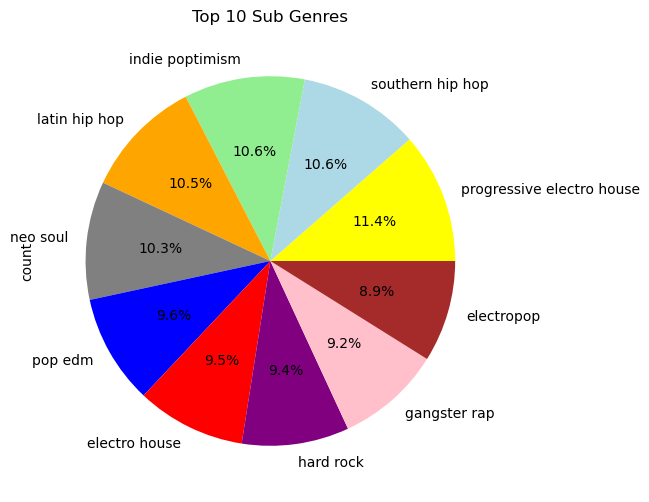

In [57]:
top_subgenres = data_cleaned['playlist_subgenre'].value_counts().nlargest(10)

# Define custom colors for the slices
custom_colors = ['yellow', 'lightblue', 'lightgreen', 'orange', 'grey', 'blue', 'red', 'purple', 'pink', 'brown']

# Create a pie chart with the top 10 sub genres
plt.figure(figsize=[10, 6])
top_subgenres.plot.pie(autopct='%3.1f%%', colors=custom_colors)
plt.title('Top 10 Sub Genres')

plt.savefig('top_subgenres.png', dpi=300) 

plt.show()


# Bar graph

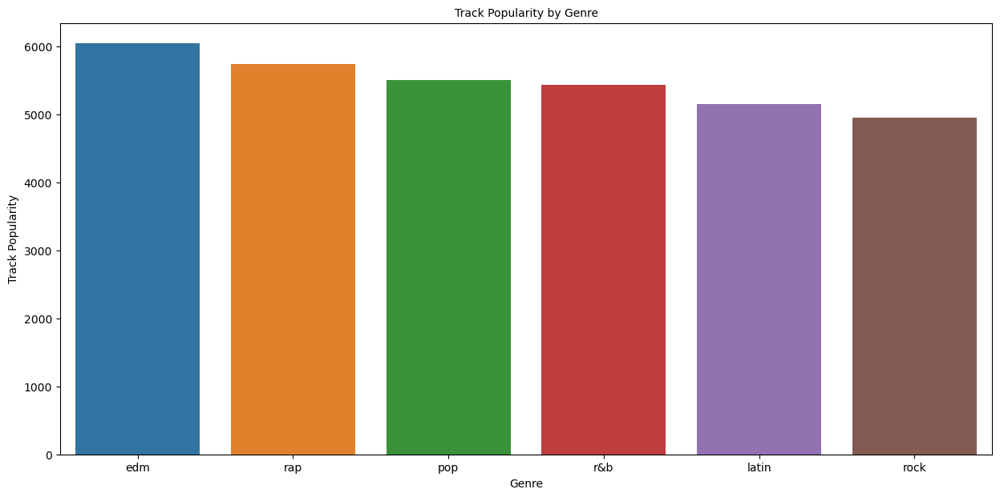

In [39]:
plt.figure(figsize=(15,7))
sns.barplot(x=top_genres.index,y=top_genres.values )
plt.xlabel('Genre',size=10)
plt.ylabel('Track Popularity',size=10)
plt.title('Track Popularity by Genre',size=10)
plt.show()

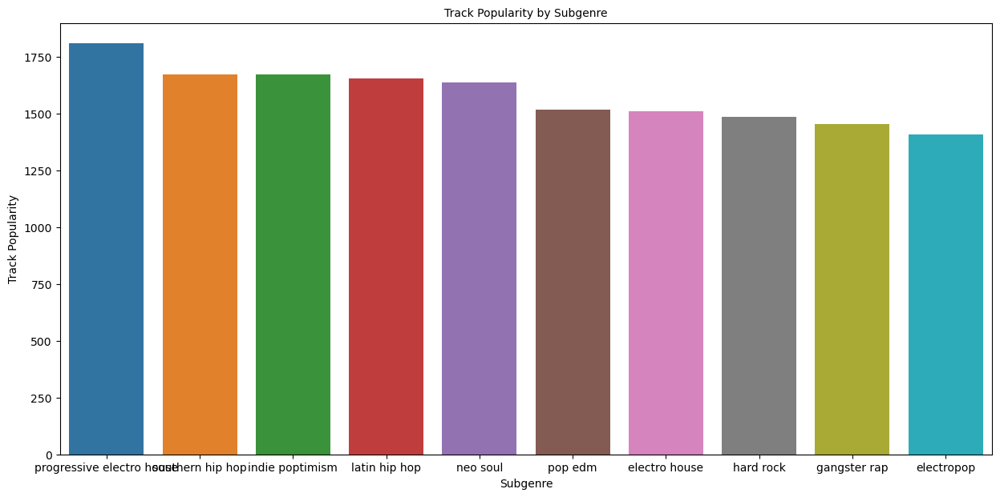

In [55]:
plt.figure(figsize=(15,7))
sns.barplot(x=top_subgenres.index,y=top_subgenres.values )
plt.xlabel('Subgenre',size=10)
plt.ylabel('Track Popularity',size=10)
plt.title('Track Popularity by Subgenre',size=10)

plt.savefig('track_popularity_by_subgenre.png', dpi=300) 

plt.show()

# Multivariate Analysis (Pairplot)

C:\Users\tonit\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

C:\Users\tonit\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

C:\Users\tonit\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.



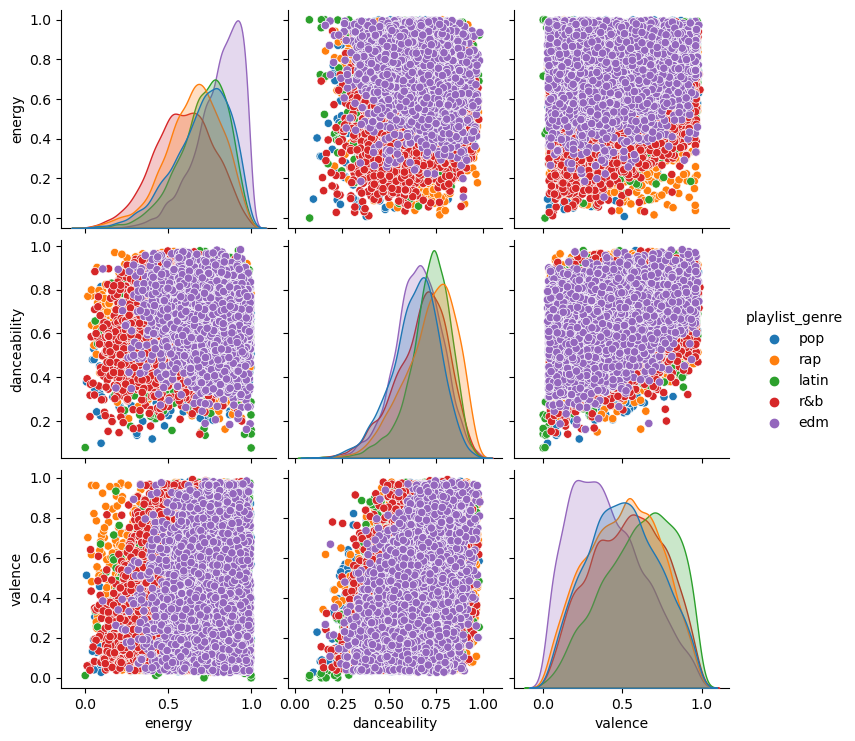

In [54]:
# GENRE
most_popular_genre = top_genres.head(5).index

# Filtering the dataset for the top 10 genres
selected_data = data_cleaned[data_cleaned['playlist_genre'].isin(most_popular_genre)]

# Selecting relevant columns
selected_columns = ['energy', 'danceability', 'valence', 'playlist_genre']

# Creating a pairplot
sns.pairplot(selected_data[selected_columns], hue='playlist_genre')

plt.savefig('playlist_genre_pairplot.png', dpi=300) 

plt.show()


C:\Users\tonit\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

C:\Users\tonit\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

C:\Users\tonit\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.



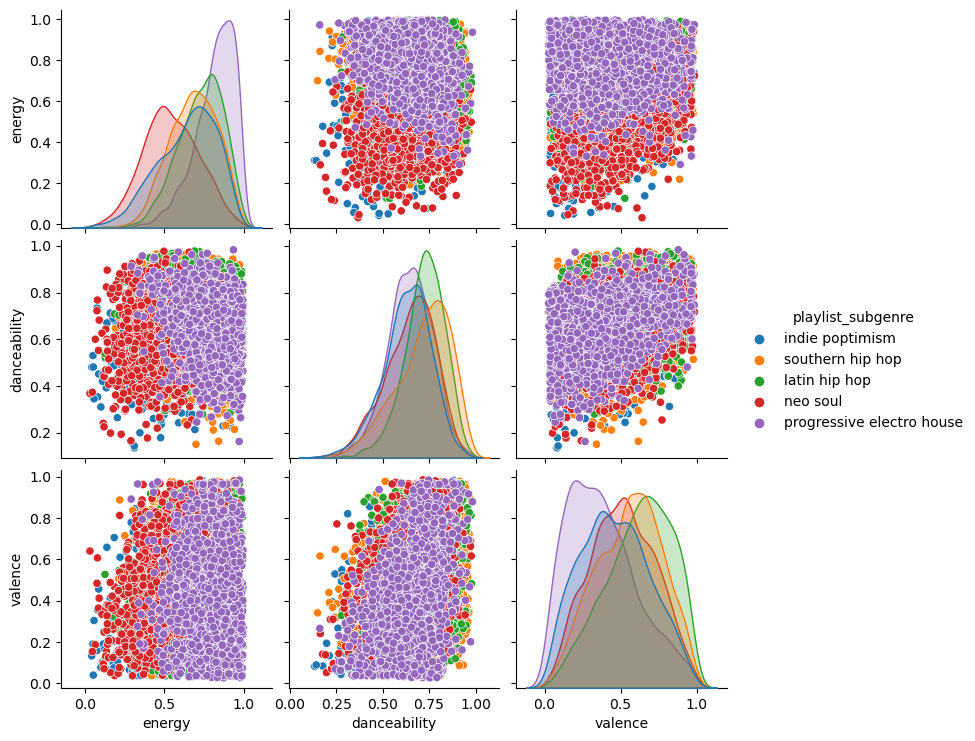

In [47]:
# SUBGENRE
most_popular_subgenre = top_subgenres.head(5).index

# Filtering the dataset for the top 10 genres
selected_data = data_cleaned[data_cleaned['playlist_subgenre'].isin(most_popular_subgenre)]

# Selecting relevant columns
selected_columns = ['energy', 'danceability', 'valence', 'playlist_subgenre']

# Creating a pairplot
sns.pairplot(selected_data[selected_columns], hue='playlist_subgenre')
plt.show()


# Most Repeated songs

In [49]:
song_counts = data_cleaned['track_name'].value_counts()
repeated_songs = song_counts[song_counts > 1]

print("Most repeated songs across playlists:")
print(repeated_songs)

Most repeated songs across playlists:
track_name
Poison                22
Breathe               21
Alive                 20
Forever               20
Stay                  19
                      ..
Bésame                 2
On & On - Mixed        2
TRUE - Single Edit     2
Lola Bunny             2
Hourglass              2
Name: count, Length: 4981, dtype: int64


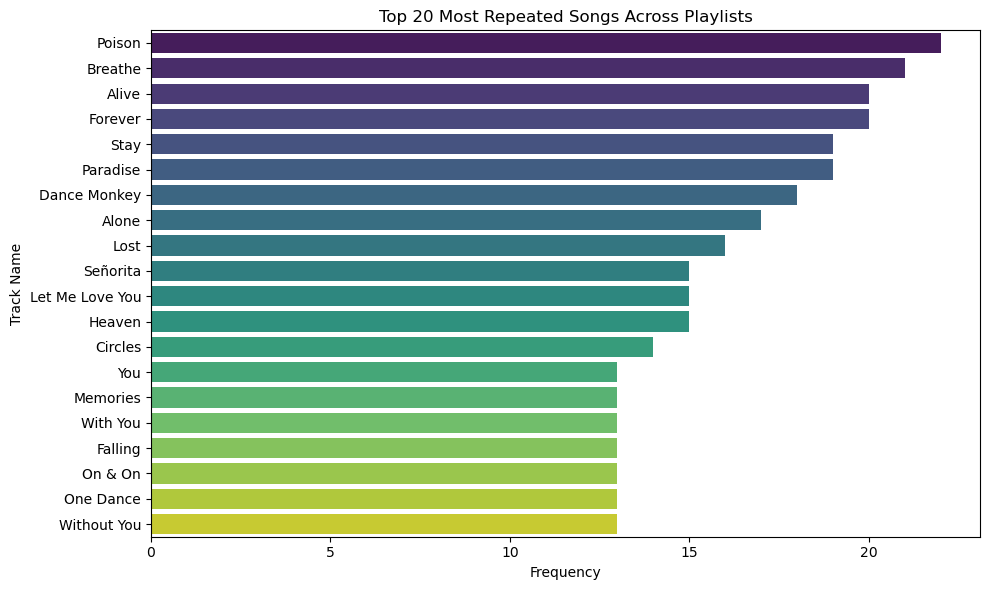

In [53]:
top_repeated_songs = repeated_songs.head(20)
top_repeated_songs = top_repeated_songs.reset_index()

top_repeated_songs.columns = ['Track Name', 'Frequency']

plt.figure(figsize=(10, 6))
sns.barplot(data=top_repeated_songs, x='Frequency', y='Track Name', palette='viridis')
plt.xlabel('Frequency')
plt.ylabel('Track Name')
plt.title('Top 20 Most Repeated Songs Across Playlists')
plt.tight_layout()

plt.savefig('top_repeated_songs.png', dpi=300) 

plt.show()